<a href="https://colab.research.google.com/github/Carereen/image-processing/blob/main/Lab3_sec2_685380122.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import numpy as np
import sys

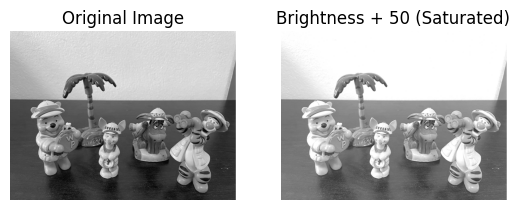

In [ ]:
path = '/content/drive/My Drive/2568-term2/image/Lab3-Image/'
image_name1 = 'img1.jpg'
image_gray = cv2.imread(path + image_name1, 0)

if image_gray is None:
  print(f'Image file not found. Please check the path: {path + image_name1} .')
  sys.exit()

image_new = cv2.add(image_gray, 50)

plt.subplot(1, 2, 1)
plt.imshow(image_gray, cmap='gray', vmin = 0, vmax = 255)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(image_new, cmap = 'gray', vmin = 0, vmax = 255)
plt.title('Brightness + 50 (Saturated)')
plt.axis('off')

plt.show()


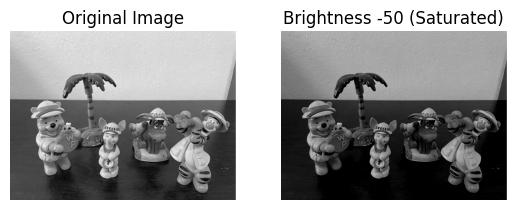

In [ ]:
image_new = cv2.subtract(image_gray, 50)

plt.subplot(1, 2, 1)
plt.imshow(image_gray, cmap = 'gray', vmin = 0, vmax = 255)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(image_new, cmap = 'gray', vmin = 0, vmax = 255)
plt.title('Brightness -50 (Saturated)')
plt.axis('off')

plt.show()

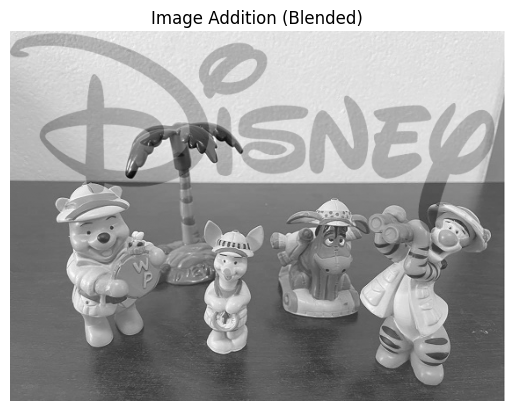

In [ ]:
image_name2 = 'img2.jpg'
image_gray2 = cv2.imread(path + image_name2, 0)

if image_gray2 is None:
  print(f'Image file not found. Please check the path: {path + image_name2} .')
  sys.exit()

if image_gray.shape != image_gray2.shape:
  image_gray2 = cv2.resize(image_gray2, (image_gray.shape[1], image_gray.shape[0]))

output1 = cv2.addWeighted(image_gray, 0.8, image_gray2, 0.2, 0)

plt.title('Image Addition (Blended)')
plt.imshow(output1, cmap = 'gray')
plt.axis('off')
plt.show()

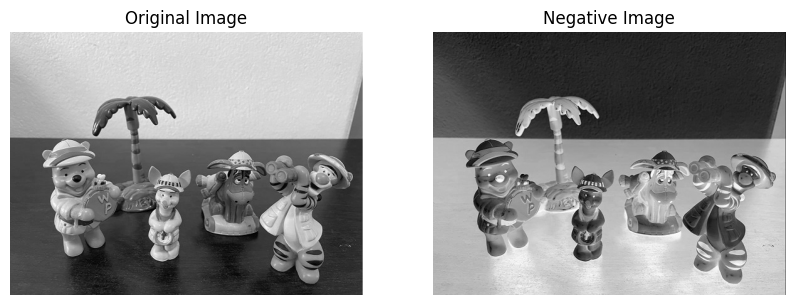

In [ ]:
# task 1
image_nagative = 255-image_gray

plt.figure(figsize = (10, 5))
plt.subplot(121)
plt.imshow(image_gray, cmap = 'gray', vmin = 0, vmax = 255)
plt.title('Original Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(image_nagative, cmap = 'gray', vmin = 0, vmax = 255)
plt.title('Negative Image')
plt.axis('off')

plt.show()

(([], []), ([], []))

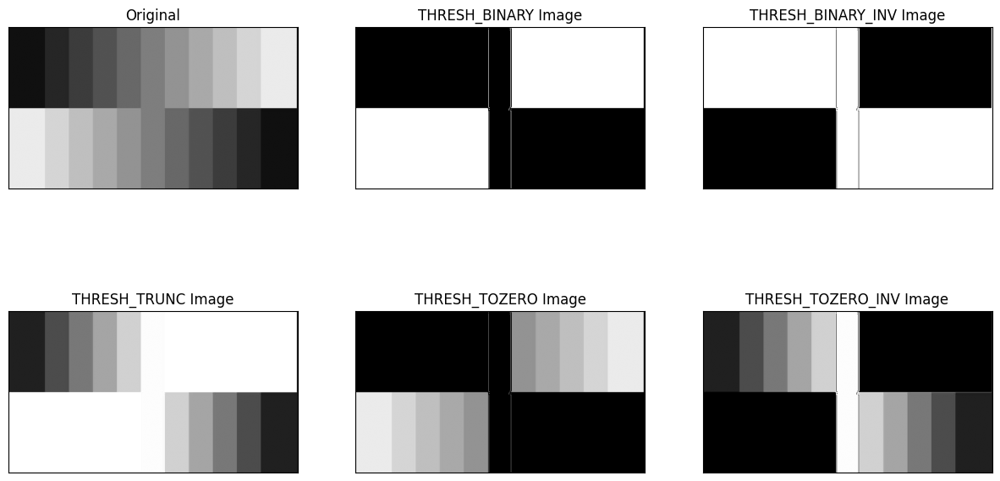

In [ ]:
# task 2
image_name3 = 'img3.jpg'
image_gray3 = cv2.imread(path + image_name3, 0)

if image_gray3 is None:
  print(f'Image file not fouond. please check the path: {path + image_name3} .')
  sys.exit()

# Thresh_binary
ret, thresh1 = cv2.threshold(image_gray3, 127, 255, cv2.THRESH_BINARY)

# thresh_binary_inv
ret, thresh2 = cv2.threshold(image_gray3, 127, 255, cv2.THRESH_BINARY_INV)

# thresh_trunc
ret, thresh3 = cv2.threshold(image_gray3, 127, 255, cv2.THRESH_TRUNC)

# thresh_tozero
ret, thresh4 = cv2.threshold(image_gray3, 127, 255, cv2.THRESH_TOZERO)

# thresh_tozero_inv
ret, thresh5 = cv2.threshold(image_gray3, 127, 255, cv2.THRESH_TOZERO_INV)

fig = plt.figure(figsize = (15, 8))

plt.subplot(231), plt.imshow(image_gray3, cmap = 'gray'), plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(232), plt.imshow(thresh1, cmap = 'gray'), plt.title('THRESH_BINARY Image')
plt.xticks([]), plt.yticks([])

plt.subplot(233), plt.imshow(thresh2, cmap = 'gray'), plt.title('THRESH_BINARY_INV Image')
plt.xticks([]), plt.yticks([])

plt.subplot(234), plt.imshow(thresh3, cmap = 'gray'), plt.title('THRESH_TRUNC Image')
plt.xticks([]), plt.yticks([])

plt.subplot(235), plt.imshow(thresh4, cmap = 'gray'), plt.title('THRESH_TOZERO Image')
plt.xticks([]), plt.yticks([])

plt.subplot(236), plt.imshow(thresh5, cmap = 'gray'), plt.title('THRESH_TOZERO_INV Image')
plt.xticks([]), plt.yticks([])

cv2.THRESH_BINARY
พิกเซลที่มากกว่า threshold เป็นสีขาว และพิกเซลที่น้อยกว่าหรือเท่ากับ threshold เป็นสีดำ ใช้แยกวัตถุออกจากพื้นหลัง

cv2.THRESH_BINARY_INV
ทำงานตรงข้ามกับ THRESH_BINARY โดยสลับสีขาวและสีดำ

cv2.THRESH_TRUNC
พิกเซลที่มากกว่า threshold ถูกตัดค่าเหลือเท่ากับ threshold ส่วนค่าที่ต่ำกว่ายังคงเดิม

cv2.THRESH_TOZERO
เก็บพิกเซลที่มากกว่า threshold ไว้ และกำหนดค่าที่ต่ำกว่าหรือเท่ากับ threshold เป็น 0

cv2.THRESH_TOZERO_INV
เก็บพิกเซลที่ต่ำกว่าหรือเท่ากับ threshold ไว้ และกำหนดค่าที่สูงกว่า threshold เป็น 0

(([], []), ([], []))

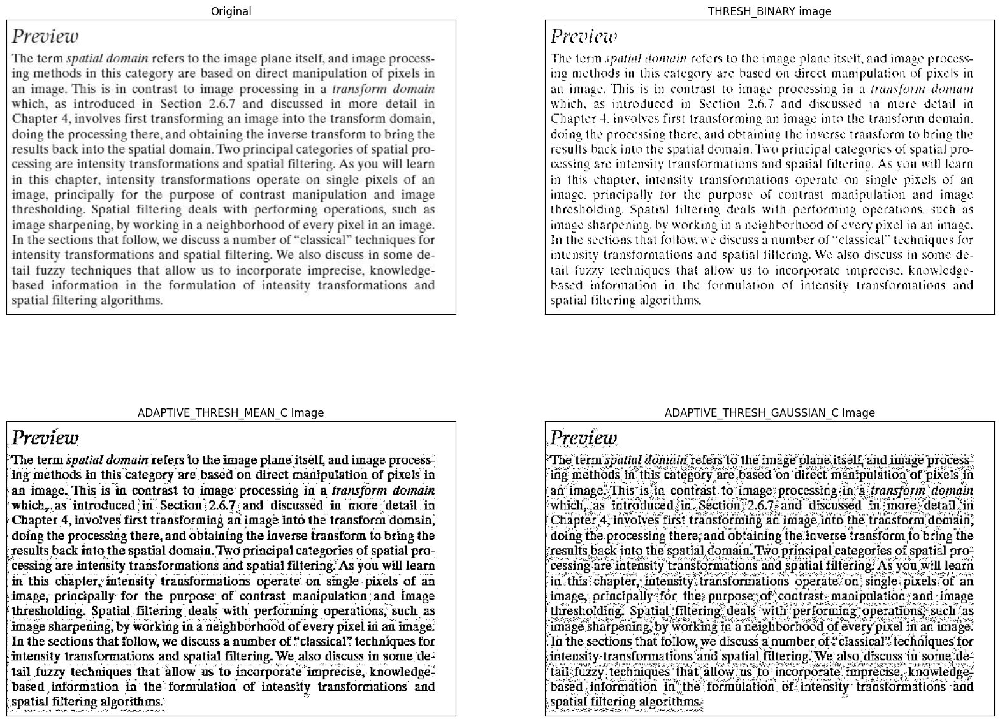

In [ ]:
image_name4 = 'img4.jpg'
image_gray4 = cv2.imread(path + image_name4, 0)

if image_gray4 is None:
  print(f'Image file not found. Please check the path: {path + image_name4} .')
  sys.exit()

ret, thresh1 = cv2.threshold(image_gray4, 127, 255, cv2.THRESH_BINARY)

adaptive_th1 = cv2.adaptiveThreshold(image_gray4, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
adaptive_th2 = cv2.adaptiveThreshold(image_gray4, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

fig = plt.figure(figsize = (20, 15))
plt.subplot(221), plt.imshow(image_gray4, cmap = 'gray'), plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(222), plt.imshow(thresh1, cmap = 'gray'), plt.title('THRESH_BINARY image')
plt.xticks([]), plt.yticks([])

plt.subplot(223), plt.imshow(adaptive_th1, cmap = 'gray'), plt.title('ADAPTIVE_THRESH_MEAN_C Image')
plt.xticks([]), plt.yticks([])

plt.subplot(224), plt.imshow(adaptive_th2, cmap = 'gray'), plt.title('ADAPTIVE_THRESH_GAUSSIAN_C Image')
plt.xticks([]), plt.yticks([])

cv2.ADAPTIVE_THRESH_MEAN_C
คำนวณค่า threshold จากค่าเฉลี่ยของพิกเซลรอบ ๆ แต่ละจุด เหมาะกับภาพที่มีแสงไม่สม่ำเสมอทั่วไป

cv2.ADAPTIVE_THRESH_GAUSSIAN_C
คำนวณค่า threshold โดยถ่วงน้ำหนักแบบ Gaussian ให้ความสำคัญกับพิกเซลใกล้จุดนั้น เหมาะกับภาพที่มีแสงซับซ้อน

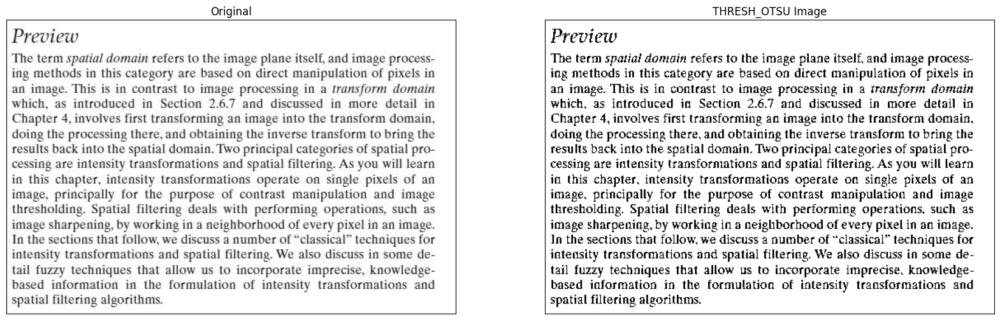

In [ ]:
# task 4
image_name4 = 'img4.jpg'
image_gray4 = cv2.imread(path + image_name4, 0)

if image_gray4 is None:
  print(f'Image file not found. Pllease check the path: {path + image_name4} .')
  sys.exit()

ret, th_otsu = cv2.threshold(image_gray4, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

fig = plt.figure(figsize = (20, 15))
plt.subplot(121), plt.imshow(image_gray4, cmap = 'gray'), plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(th_otsu, cmap = 'gray'), plt.title('THRESH_OTSU Image')
plt.xticks([]), plt.yticks([])
plt.show()

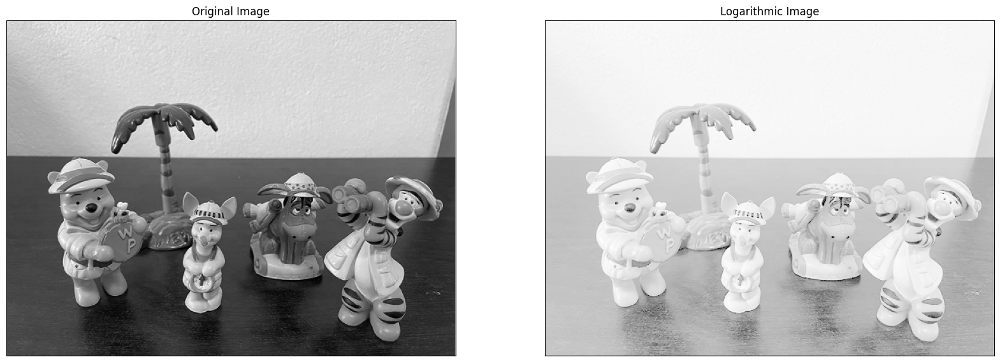

In [ ]:
# task 5
image_name = 'img1.jpg'
image_gray = cv2.imread(path + image_name, 0)

if image_gray is None:
  print(f'Image file not found. Please check the path: {path + image_name} .')
  sys.exit()

image_float = image_gray.astype(np.float64)

c = 255 / np.log(1 + np.max(image_float))
image_log = c * (np.log(image_float + 1))

image_log = np.array(image_log, dtype = np.uint8)

fig = plt.figure(figsize = (20, 15))
plt.subplot(121), plt.imshow(image_gray, cmap = 'gray'), plt.title('Original Image')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(image_log, cmap = 'gray'), plt.title('Logarithmic Image')
plt.xticks([]), plt.yticks([])
plt.show()

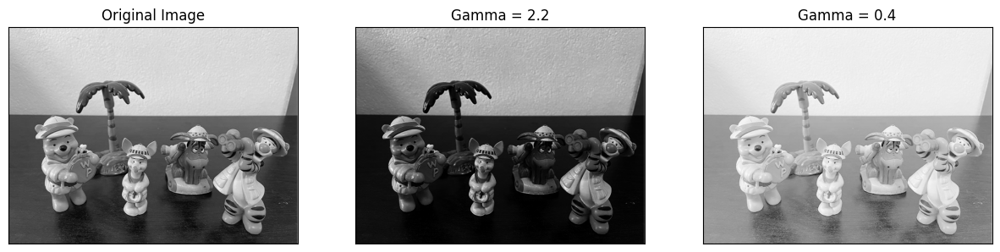

In [ ]:
# task 6
image_name1 = 'img1.jpg'
image_gray1 = cv2.imread(path + image_name1, 0)

if image_gray1 is None:
  print(f'Image file not found. Please check the path: {path + image_name1} .')
  sys.exit()

image_gamma1 = np.array(255 * (image_gray / 255.0) ** 2.2, dtype = 'uint8')

image_gamma2 = np.array(255 * (image_gray / 255.0) ** 0.4, dtype = 'uint8')

fig = plt.figure(figsize = (15, 15))
plt.subplot(131), plt.imshow(image_gray, cmap = 'gray'), plt.title('Original Image')
plt.xticks([]), plt.yticks([])

plt.subplot(132), plt.imshow(image_gamma1, cmap = 'gray'), plt.title('Gamma = 2.2')
plt.xticks([]), plt.yticks([])

plt.subplot(133), plt.imshow(image_gamma2, cmap = 'gray'), plt.title('Gamma = 0.4')
plt.xticks([]), plt.yticks([])

plt.show()

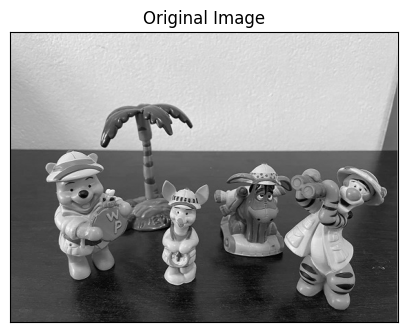

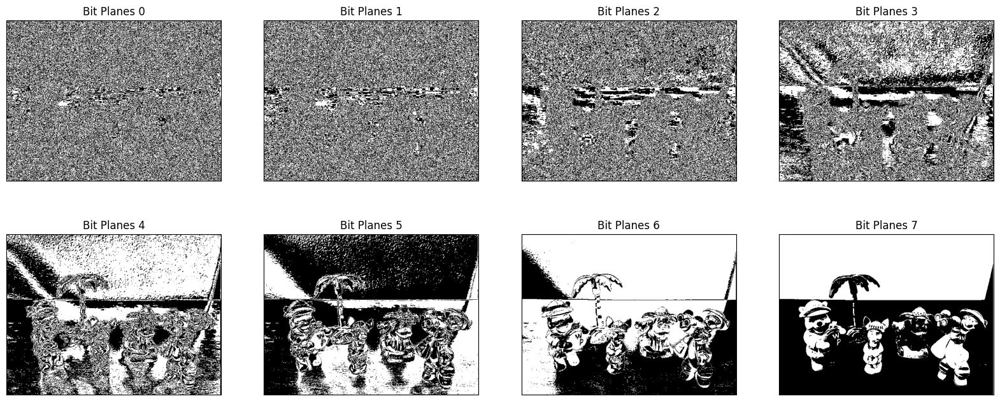

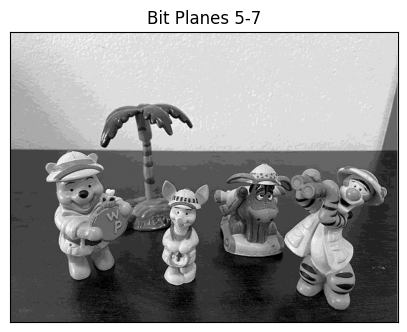

In [ ]:
# task 7
image_name1 = 'img1.jpg'
image_gray = cv2.imread(path + image_name1, 0)

if image_gray is None:
    print(f'Image file not found. Please check the path: {path + image_name1}.')
    sys.exit()

plt.figure(figsize=(5, 8))
plt.title("Original Image")
plt.imshow(image_gray, cmap="gray")
plt.xticks([]), plt.yticks([])
plt.show()

r, c = image_gray.shape
m = r


x = np.zeros((r, c, 8), dtype=np.uint8)
for i in range(8):
    x[:, :, i] = 2 ** i

r_img = np.zeros((r, c, 8), dtype=np.uint8)
m_img = np.zeros((m, c, 8), dtype=np.uint8)

plt.figure(figsize=(20, 8))
for i in range(8):
    r_img[:, :, i] = cv2.bitwise_and(image_gray, x[:, :, i])
    m_img[:, :, i] = cv2.bitwise_and(image_gray, x[:, :, i])

    mask = r_img[:, :, i] > 0
    r_img[mask] = 255

    plt.subplot(2, 4, i + 1)
    plt.title("Bit Planes " + str(i))
    plt.xticks([]), plt.yticks([])
    plt.imshow(r_img[:, :, i], cmap="gray")

plt.show()


img_5_7 = m_img[:, :, 4] + m_img[:, :, 5] + m_img[:, :, 6] + m_img[:, :, 7]

plt.figure(figsize=(5, 8))
plt.title("Bit Planes 5-7")
plt.imshow(img_5_7, cmap="gray")
plt.xticks([]), plt.yticks([])
plt.show()

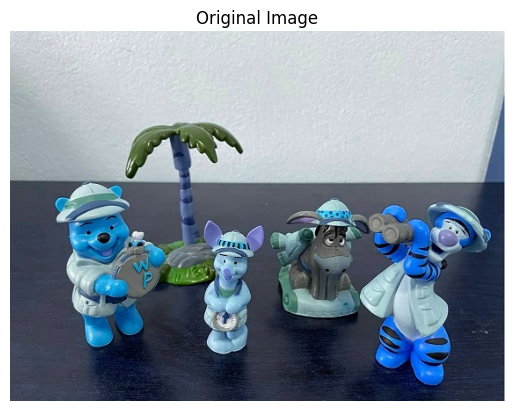

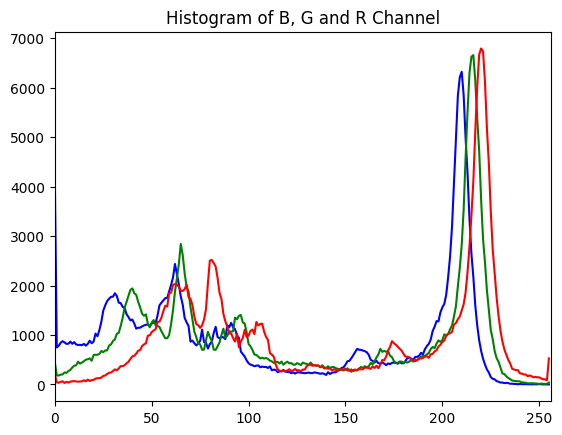

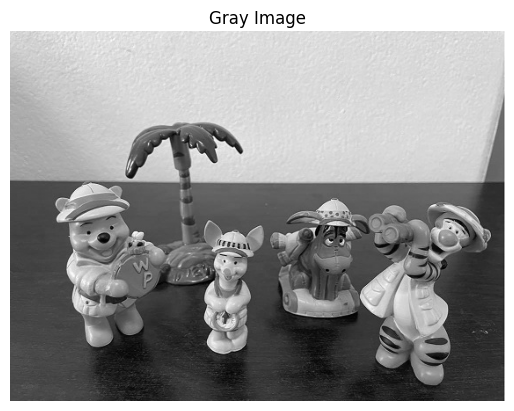

/tmp/ipython-input-1702571057.py:32: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(image_gray.ravel(), 256, [0, 256])


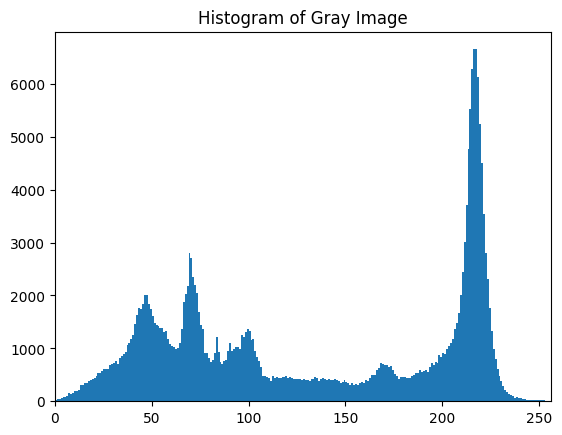

In [ ]:
image_name1 = 'img1.jpg'
image_bgr = cv2.imread(path + image_name1, 1)

if image_bgr is None:
    print(f'Image file not found. Please check the path: {path + image_name1}.')
    sys.exit()

plt.title("Original Image")
plt.imshow(image_bgr)
plt.axis('off')
plt.show()

color = ('b', 'g', 'r')
plt.title("Histogram of B, G and R Channel")

for i, col in enumerate(color):
    histr = cv2.calcHist([image_bgr], [i], None, [256], [0, 256])
    plt.plot(histr, color=col)

plt.xlim([0, 256])
plt.show()

image_gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

plt.title("Gray Image")
plt.imshow(image_gray, cmap='gray')
plt.axis('off')
plt.show()

plt.title("Histogram of Gray Image")
plt.hist(image_gray.ravel(), 256, [0, 256])
plt.xlim([0, 256])
plt.show()

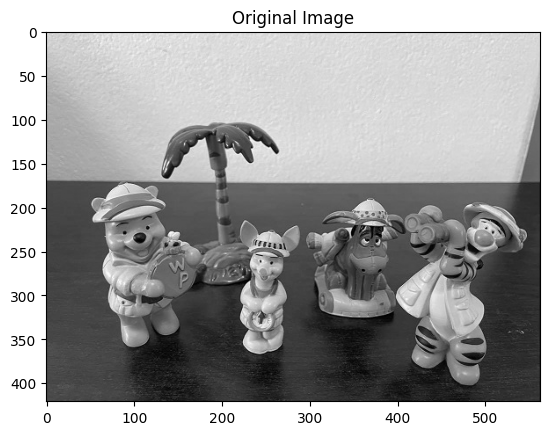

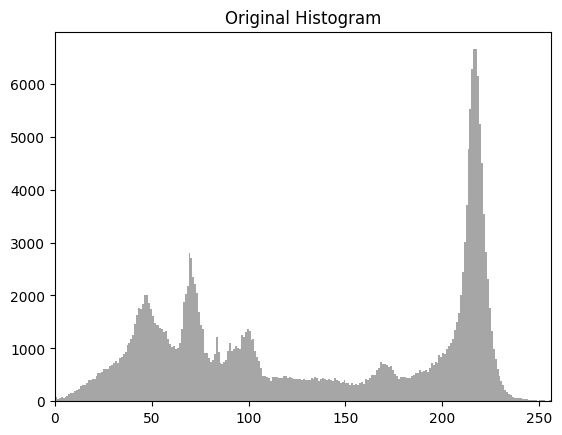

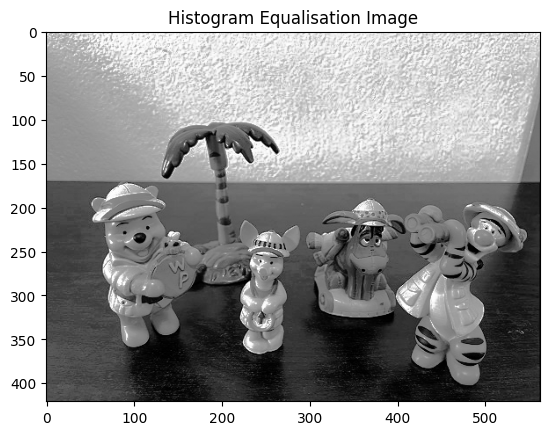

(0.0, 256.0)

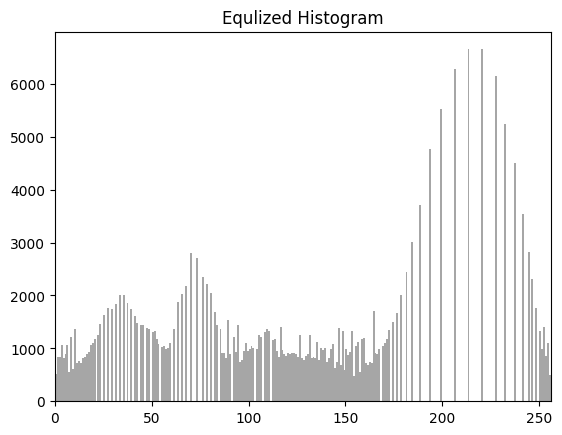

In [ ]:
# task 8
image_name1 = 'img1.jpg'
image_gray = cv2.imread(path + image_name1, 0)

if image_gray is None:
  print(f'Image file not found. please check the path: {path + image_name1} .')
  sys.exit()

plt.title("Original Image")
plt.imshow(image_gray, cmap = 'gray')
plt.show()

plt.title('Original Histogram')
plt.hist(image_gray.ravel(), bins = 256, range = [0, 256], color = 'gray', alpha = 0.7)
plt.xlim([0, 256])
plt.show()

plt.title('Histogram Equalisation Image')
image_equ = cv2.equalizeHist(image_gray)
plt.imshow(image_equ, cmap = 'gray')
plt.show()
plt.title('Equlized Histogram')
plt.hist(image_equ.ravel(), bins = 256, range = [0, 256], color = 'gray', alpha = 0.7)
plt.xlim([0, 256])

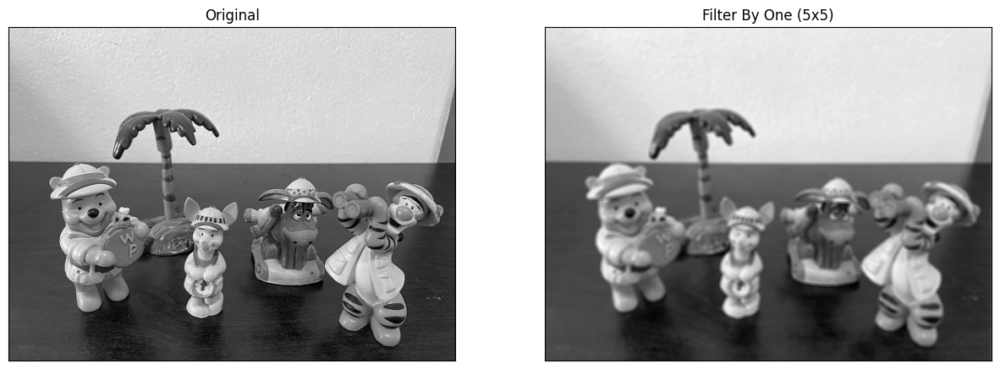

In [ ]:
# task 9
image_name1 = 'img1.jpg'
image_gray = cv2.imread(path + image_name1, 0)

if image_gray is None:
    print(f'Image file not found. Please check the path: {path + image_name1}.')
    sys.exit()

kernel = np.ones((5, 5), np.float32) / 25

dst = cv2.filter2D(image_gray, -1, kernel)

plt.figure(figsize=(15, 15))

plt.subplot(121)
plt.imshow(image_gray, cmap='gray')
plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.imshow(dst, cmap='gray')
plt.title('Filter By One (5x5)')
plt.xticks([]), plt.yticks([])

plt.show()

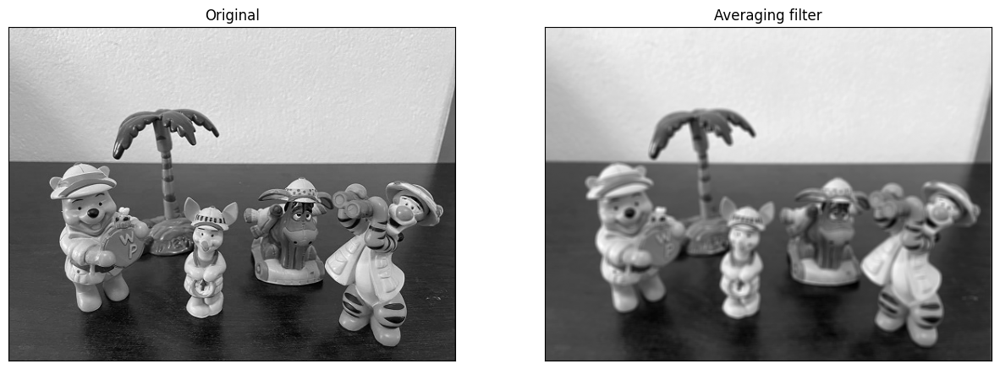

In [ ]:
# task 10
image_name1 = 'img1.jpg'
image_gray = cv2.imread(path + image_name1, 0)

if image_gray is None:
    print(f'Image file not found. Please check the path: {path + image_name1}.')
    sys.exit()

image_blur = cv2.blur(image_gray, (5, 5))

fig = plt.figure(figsize = (15, 15))
plt.subplot(121), plt.imshow(image_gray, cmap = 'gray'), plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(image_blur, cmap = 'gray'), plt.title('Averaging filter')
plt.xticks([]), plt.yticks([])

plt.show()

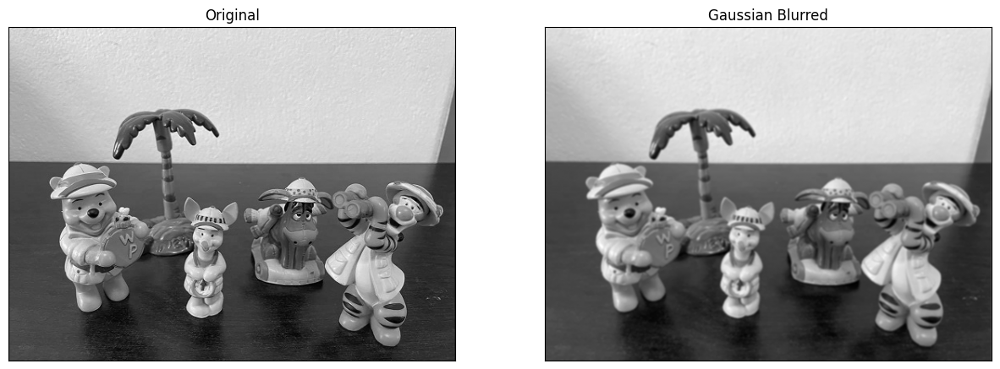

In [ ]:
# task 11

image_name1 = 'img1.jpg'
image_gray = cv2.imread(path + image_name1, 0)

if image_gray is None:
    print(f'Image file not found. Please check the path: {path + image_name1}.')
    sys.exit()

image_blur = cv2.GaussianBlur(image_gray, (5,5), 0)

fig = plt.figure(figsize=(15, 15))
plt.subplot(121), plt.imshow(image_gray, cmap = 'gray'), plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(image_blur, cmap = 'gray'), plt.title('Gaussian Blurred')
plt.xticks([]), plt.yticks([])

plt.show()

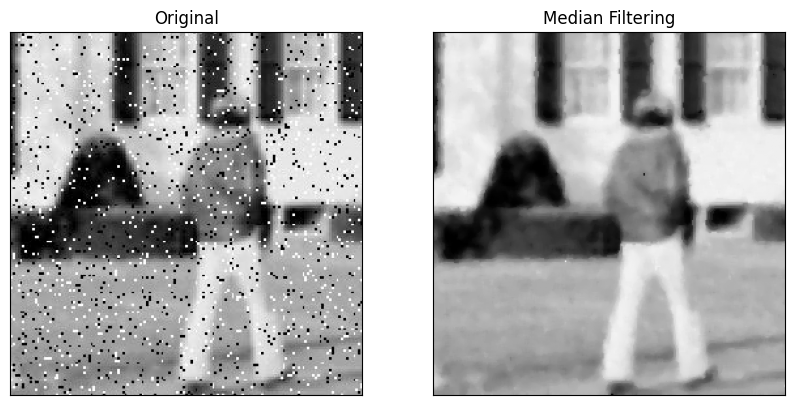

In [ ]:
image_name = 'noise.jpg'
image_gray = cv2.imread(path + image_name, 0)

if image_gray is None:
    print(f'Image file not found. Please check the path: {path + image_name}.')
    sys.exit()

image_median = cv2.medianBlur(image_gray, 5)

fig = plt.figure(figsize=(10, 10))
plt.subplot(121), plt.imshow(image_gray, cmap = 'gray'), plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(image_median, cmap = 'gray'), plt.title('Median Filtering')
plt.xticks([]), plt.yticks([])

plt.show()

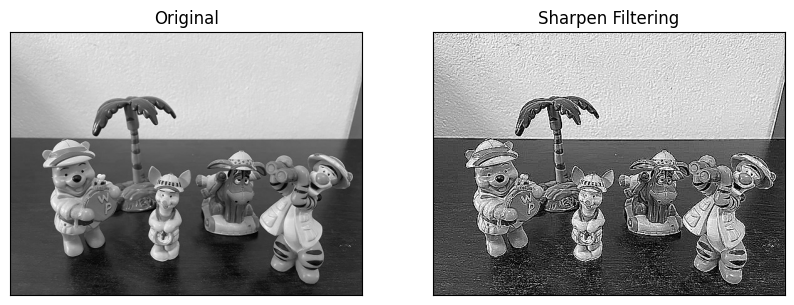

In [ ]:
# task 12
image_name1 = 'img1.jpg'
image_gray = cv2.imread(path + image_name1, 0)

if image_gray is None:
    print(f'Image file not found. Please check the path: {path + image_name1}.')
    sys.exit()

kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])

image_sharpen = cv2.filter2D(image_gray, -1, kernel)

fig = plt.figure(figsize=(10, 10))
plt.subplot(121), plt.imshow(image_gray, cmap = 'gray'), plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(image_sharpen, cmap = 'gray'), plt.title('Sharpen Filtering')
plt.xticks([]), plt.yticks([])

plt.show()

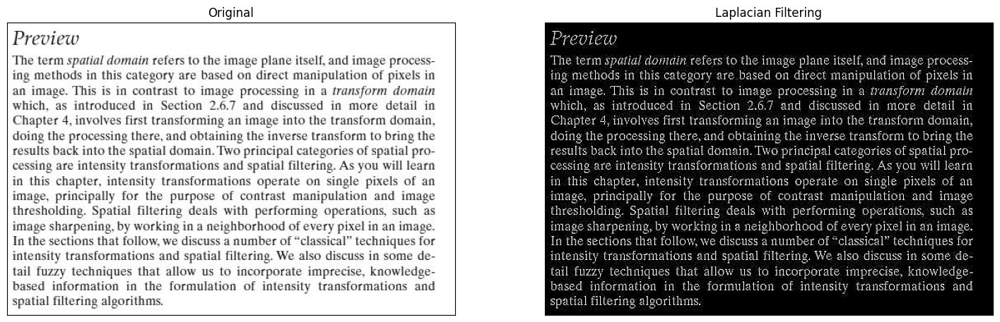

In [ ]:
image_name4 = 'img4.jpg'
image_gray = cv2.imread(path + image_name4, 0)

if image_gray is None:
    print(f'Image file not found. Please check the path: {path + image_name1}.')
    sys.exit()

image_laplacian = cv2.Laplacian(image_gray, cv2.CV_8U)

fig = plt.figure(figsize=(18, 18))
plt.subplot(121), plt.imshow(image_gray, cmap = 'gray'), plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(image_laplacian, cmap = 'gray'), plt.title('Laplacian Filtering')
plt.xticks([]), plt.yticks([])

plt.show()

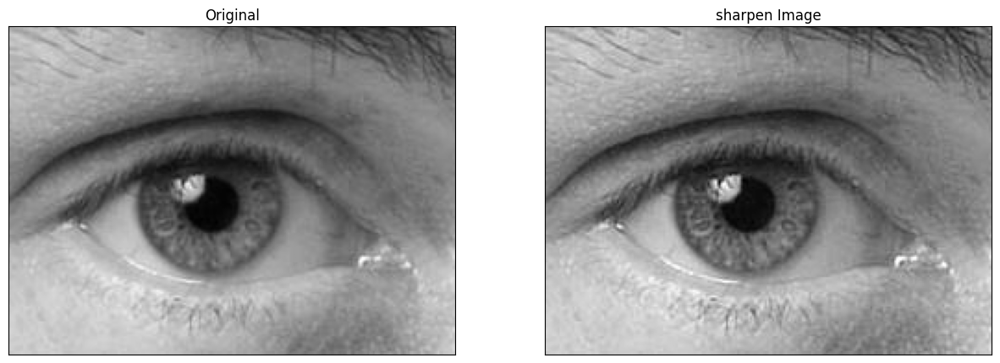

In [ ]:
image_name5 = 'img5.jpg'
image_gray = cv2.imread(path + image_name5, 0)

if image_gray is None:
    print(f'Image file not found. Please check the path: {path + image_name1}.')
    sys.exit()

unsharp_image = cv2.GaussianBlur(image_gray, (7, 7), 0)

sharpen_image = cv2.addWeighted(image_gray, 1.5, unsharp_image, -0.5, 0)

fig = plt.figure(figsize=(15, 15))
plt.subplot(121), plt.imshow(image_gray, cmap = 'gray'), plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(sharpen_image, cmap = 'gray'), plt.title('sharpen Image')
plt.xticks([]), plt.yticks([])

plt.show()